In [133]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

#%matplotlib inline


In [163]:
df = pd.read_csv("job-market(2).csv")


#Remove rows with invalid Location cells
df = df.dropna(subset=['Location'])
df.head()

,Id,Title,Company,Date,Location,Area,Classification,SubClassification,Requirement,FullDescription,LowestSalary,HighestSalary,JobType
0,37404348.0,Casual Stock Replenisher,Aldi Stores,2018-10-07T00:00:00.000Z,Sydney,North West & Hills District,Retail & Consumer Products,Retail Assistants,Our Casual Stock Replenishers pride themselves...,NaN,0.0,30.0,NaN
1,37404337.0,Casual Stock Replenisher,Aldi Stores,2018-10-07T00:00:00.000Z,Richmond & Hawkesbury,NaN,Retail & Consumer Products,Retail Assistants,Our Casual Stock Replenishers pride themselves...,NaN,0.0,30.0,NaN
2,37404356.0,RETAIL SALES SUPERSTARS and STYLISTS Wanted - ...,LB Creative Pty Ltd,2018-10-07T00:00:00.000Z,Brisbane,CBD & Inner Suburbs,Retail & Consumer Products,Retail Assistants,BRAND NEW FLAGSHIP STORE OPENING - SUNSHINE PLAZA,NaN,0.0,30.0,NaN
3,37404330.0,Team member - Belrose,Anaconda Group Pty Ltd,2018-10-07T00:00:00.000Z,Gosford & Central Coast,NaN,Retail & Consumer Products,Retail Assistants,Bring it on - do you love the great outdoors a...,NaN,0.0,30.0,NaN
4,37404308.0,"Business Banking Contact Centre Specialist, Ni...",Commonwealth Bank - Business & Private Banking,2018-10-07T00:00:00.000Z,Sydney,Ryde & Macquarie Park,Call Centre & Customer Service,Sales - Inbound,"We are seeking highly articulate, enthusiastic...",NaN,0.0,30.0,NaN


You may need to run the cell below twice

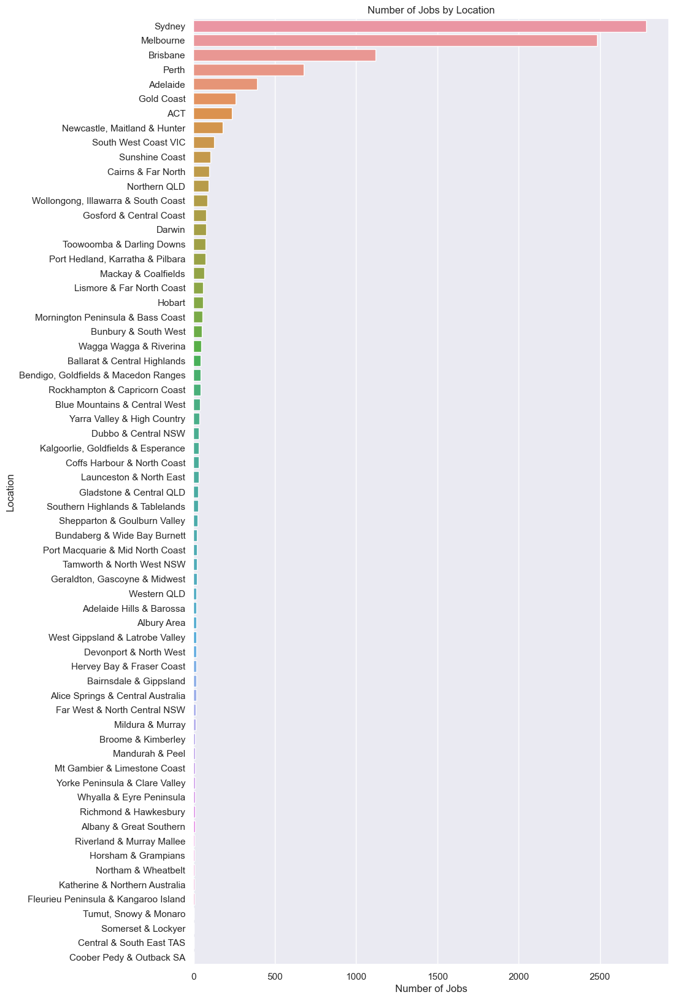

In [164]:

#Column name for data to be represented
col_name = "Location"

#Create count plot using Seaborn
bar = sns.countplot(y=col_name, data=df, order=df[col_name].value_counts().index, width = 0.8)
#Set Axis labels
bar.set(title="Number of Jobs by Location", xlabel="Number of Jobs", ylabel=col_name)
#Set size of plot
sns.set(rc={'figure.figsize':(10,20)})


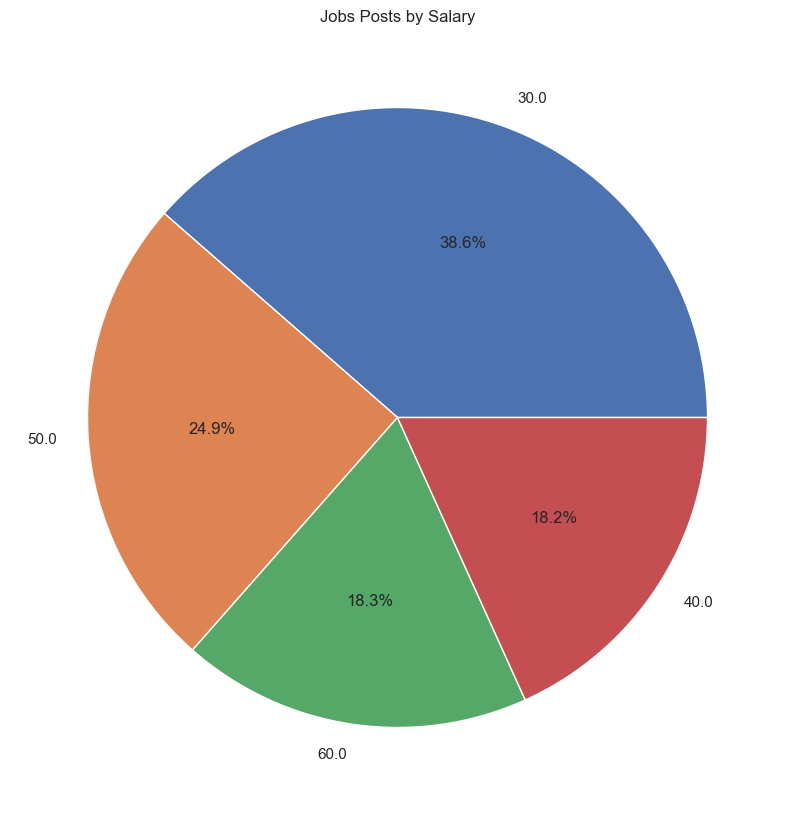

In [165]:
#Highest Salary
col_name = "HighestSalary"
plt.title("Jobs Posts by Salary")
plt.pie(df[col_name].value_counts(), labels=df[col_name].value_counts().index, autopct='%1.1f%%')
plt.show()

In [166]:
wine = pd.read_csv("wine.data.csv")

wine.head()

,Label,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [167]:
#Remove label column
wineLabels = wine[wine.columns[0]]
del wine[wine.columns[0]]
wine.head()

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


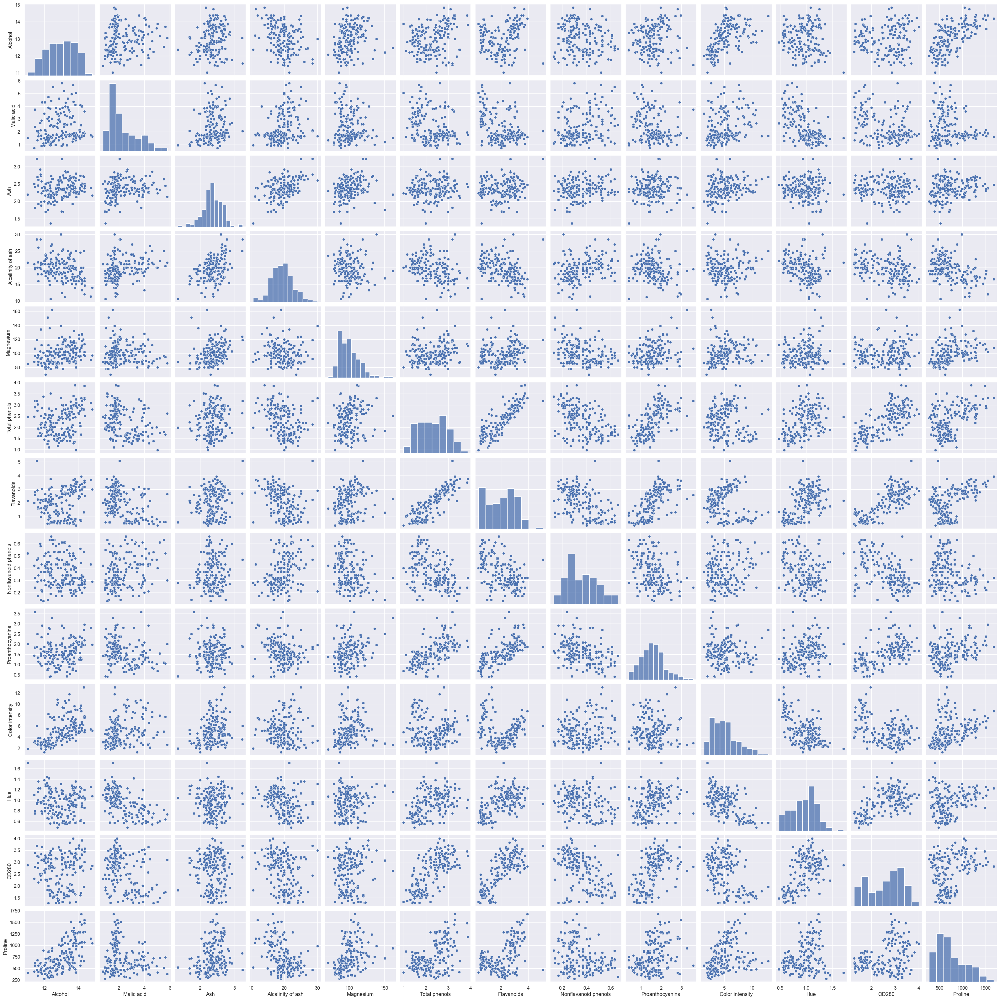

In [168]:
sns.pairplot(wine)

From the scatter plot, it's hard for us to cluster the data.

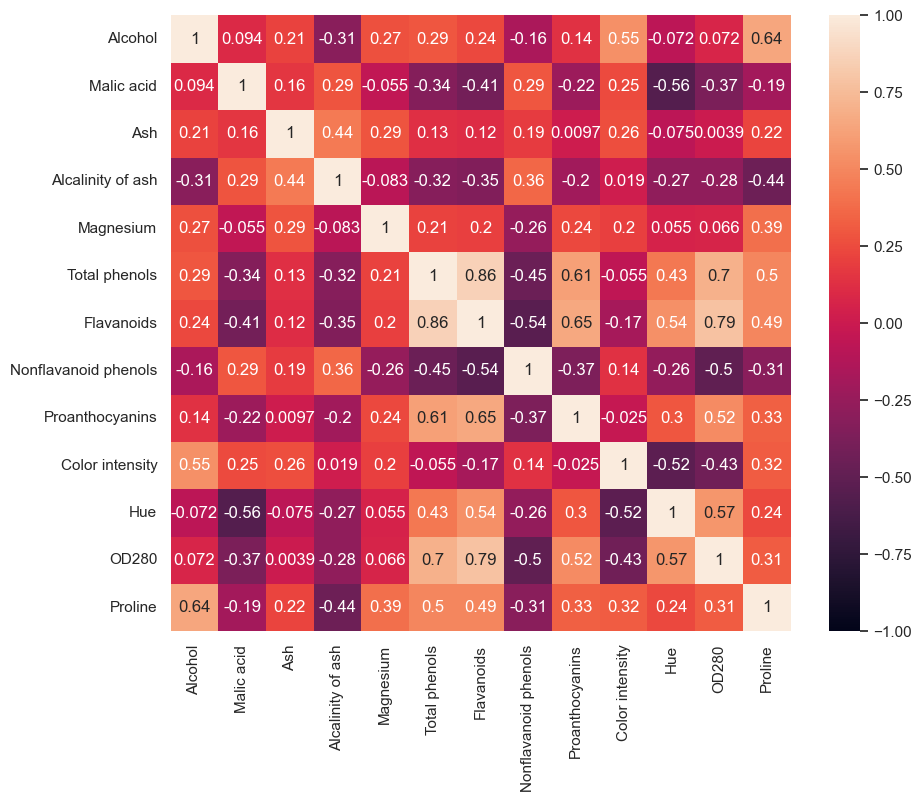

In [171]:
#Some reason running twice will fix the plot display - similar to first plot 
sns.heatmap(wine.corr(), vmin =-1, vmax =1, annot=True)
sns.set(rc={'figure.figsize':(10,8)})

From the heatmap above, we can conclude that
* "Flavanoids" and "Total phenols" (0.86);
* "OD280" and "Flavanoids" (0.79);
* "OD280" and "Total phenols" (0.7);

have the largest correlation.

In [138]:
import sklearn
from sklearn.cluster import KMeans

In [172]:
wine.describe()

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


In [200]:
#wine = pd.read_csv("wine.data.csv")
kMeansClustering = KMeans(n_clusters=3, random_state=0, n_init=10)
kMeansClustering = kMeansClustering.fit(wine)



C:\Users\James\anaconda3\envs\3803\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [201]:
kMeansClustering.cluster_centers_

array([[1.29298387e+01, 2.50403226e+00, 2.40806452e+00, 1.98903226e+01,
        1.03596774e+02, 2.11112903e+00, 1.58403226e+00, 3.88387097e-01,
        1.50338710e+00, 5.65032258e+00, 8.83967742e-01, 2.36548387e+00,
        7.28338710e+02, 8.88178420e-16, 8.88178420e-16],
       [1.38044681e+01, 1.88340426e+00, 2.42617021e+00, 1.70234043e+01,
        1.05510638e+02, 2.86723404e+00, 3.01425532e+00, 2.85319149e-01,
        1.91042553e+00, 5.70255319e+00, 1.07829787e+00, 3.11404255e+00,
        1.19514894e+03, 1.00000000e+00, 1.00000000e+00],
       [1.25166667e+01, 2.49420290e+00, 2.28855072e+00, 2.08231884e+01,
        9.23478261e+01, 2.07072464e+00, 1.75840580e+00, 3.90144928e-01,
        1.45188406e+00, 4.08695651e+00, 9.41159420e-01, 2.49072464e+00,
        4.58231884e+02, 2.00000000e+00, 2.00000000e+00]])

In [196]:
wine["clusters"]=kMeansClustering.labels_
wine.head()

,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline,cluster,clusters
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1,1
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1,1
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1,1
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1,1
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,0,0


In [180]:
wine['clusters'].value_counts()

2    69
0    62
1    47
Name: clusters, dtype: int64

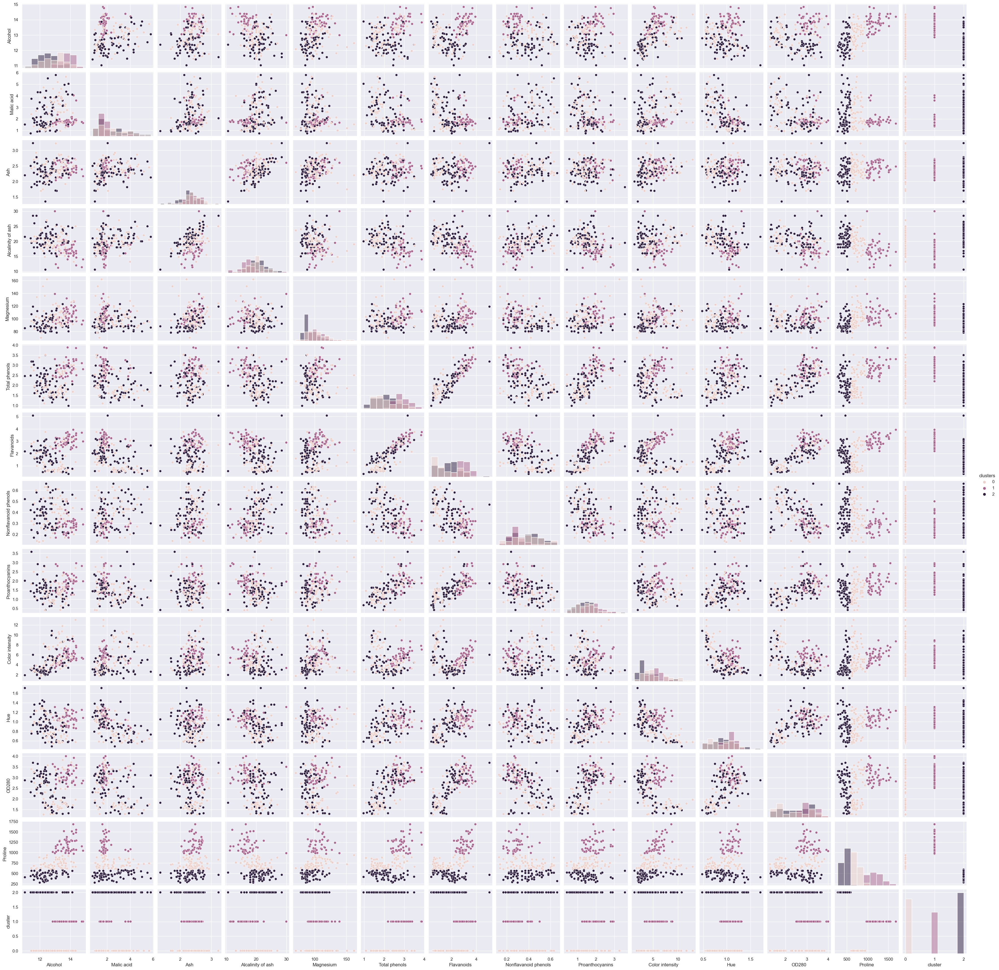

In [181]:
sns.pairplot(wine, hue="clusters", diag_kind="hist")

In [187]:
standardScaler = sklearn.preprocessing.StandardScaler()
standardScaler.fit(wine)
X_scaled_array = standardScaler.transform(wine)
normalizedData = pd.DataFrame(X_scaled_array, columns = wine.columns)

C:\Users\James\anaconda3\envs\3803\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


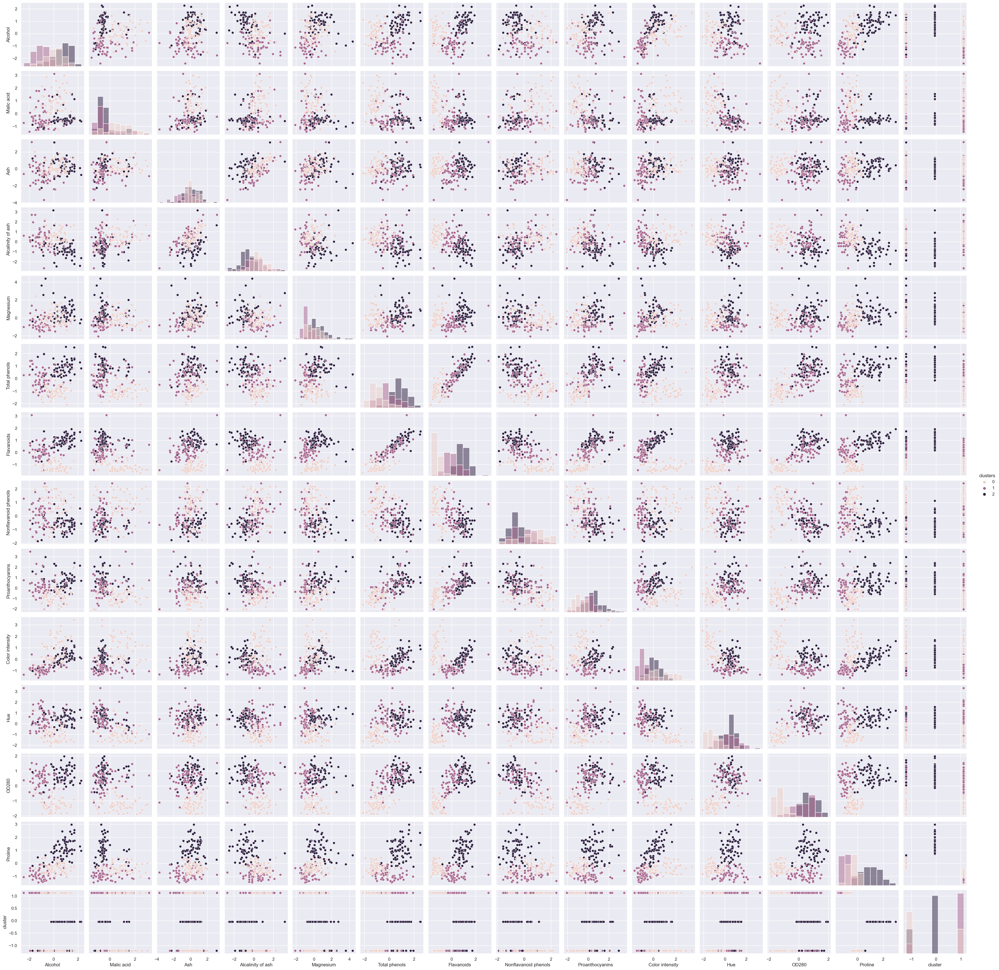

In [202]:
kMeansClustering = KMeans(n_clusters=3, random_state=0, n_init=10)
kMeansClustering = kMeansClustering.fit(normalizedData)

normalizedData["clusters"]=kMeansClustering.labels_
sns.pairplot(normalizedData, hue="clusters", diag_kind="hist")

In [222]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [231]:
df_transform = StandardScaler().fit_transform(normalizedData)
pca = PCA(n_components=6).fit_transform(df_transform)

pca


array([[-3.49867856, -1.34806098, -0.09853185,  0.03674103,  0.47253893,
        -0.58267493],
       [-2.48374534,  0.28372427, -2.03582751, -0.01867281, -0.3992958 ,
        -0.55254363],
       [-2.76028776, -0.90908027,  1.05798808,  0.66500598,  0.11372424,
         0.77452871],
       ...,
       [ 2.92836989, -3.09488957, -0.91824913, -0.16047429,  1.29147582,
         0.21537416],
       [ 2.66131413, -2.68693356, -0.59385081, -0.96617482,  0.52255471,
         0.6726735 ],
       [ 3.49900047, -2.19238781,  1.32180142,  1.822514  , -0.78180176,
        -0.35995104]])

In [240]:
df = pd.DataFrame(pca)
df

,0,1,2,3,4,5
0,-3.498679,-1.348061,-0.098532,0.036741,0.472539,-0.582675
1,-2.483745,0.283724,-2.035828,-0.018673,-0.399296,-0.552544
2,-2.760288,-0.909080,1.057988,0.665006,0.113724,0.774529
3,-3.899795,-2.530995,0.014036,1.207111,-0.101491,-0.093928
4,-1.426506,-1.179455,1.933246,-1.016856,0.158368,0.049025
...,...,...,...,...,...,...
173,3.550591,-2.507097,-0.288595,0.729436,-0.051962,0.361464
174,2.857314,-2.099416,0.187498,-0.146662,0.453470,0.428305
175,2.928370,-3.094890,-0.918249,-0.160474,1.291476,0.215374
176,2.661314,-2.686934,-0.593851,-0.966175,0.522555,0.672674


C:\Users\James\anaconda3\envs\3803\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


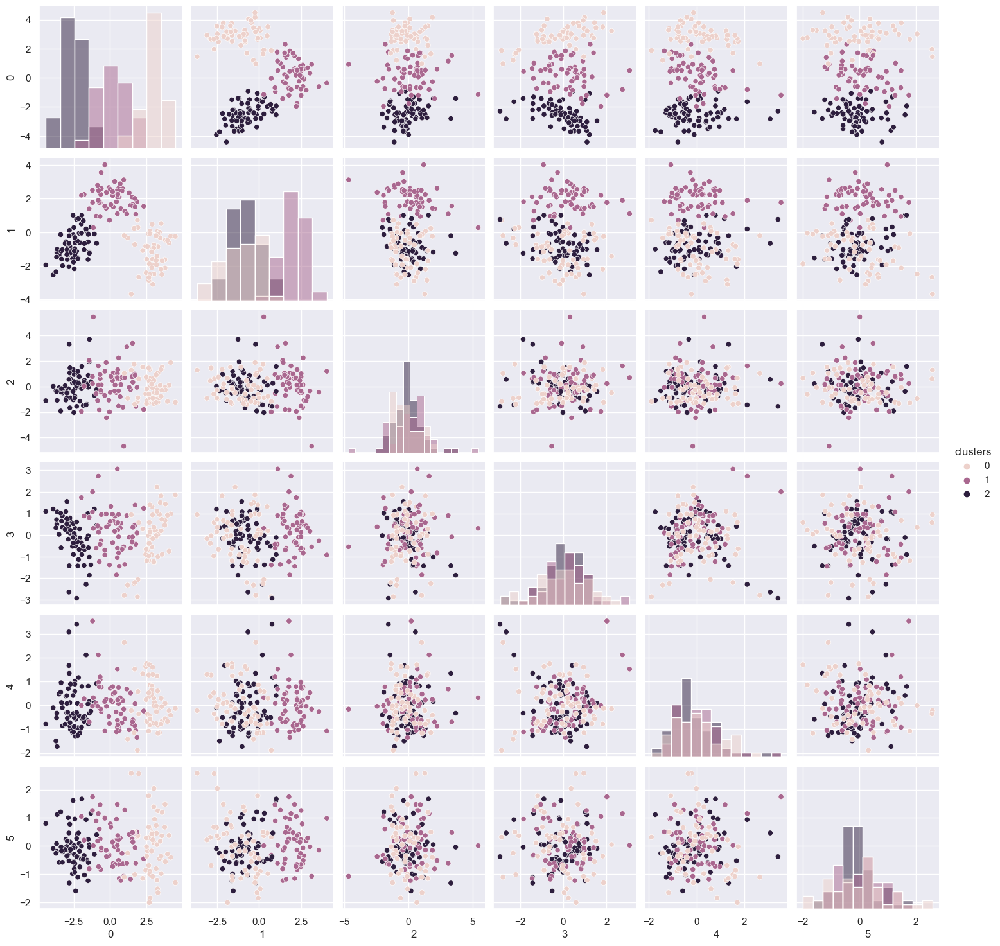

In [241]:
kMeansClustering = KMeans(n_clusters=3, random_state=0, n_init=10)
kMeansClustering = kMeansClustering.fit(df)

df["clusters"]=kMeansClustering.labels_
sns.pairplot(df, hue="clusters", diag_kind="hist")